<a href='https://akademie.datamics.com/kursliste/'>![title](bg_datamics_top.png)</a>
___
<center><em>© Datamics</em></center>
<center><em>Besuche uns für mehr Informationen auf <a href='https://akademie.datamics.com/kursliste/'>www.akademie.datamics.com</a></em></center>

# Übersicht Mit Bildern Arbeiten

Mithilfe einiger leistungsfähiger Zusatzbibliotheken wie dem einfach zu installierenden Pillow gewinnt Python die Fähigkeit der Bildmanipulation für einfache Aufgaben. So kannst du Pillow installieren:

    pip install pillow
    
Wirf bei Problemen einen Blick in die [offizielle Dokumentation](http://pillow.readthedocs.io/en/3.4.x/installation.html) von Pillow. In den meisten Fällen sollte die einfache Installation mit Pip funktionieren.

____
**Beachte: Wenn du im Notebook mit Bildern arbeitest, könntest du die folgende Warnung ausgegeben bekommen:**

    IOPub data rate exceeded.
    The notebook server will temporarily stop sending output
    to the client in order to avoid crashing it.
    To change this limit, set the config variable
    `--NotebookApp.iopub_data_rate_limit`.
    
**Falls diese Warnung erscheint, beende das Notebook in der Kommandozeile und starte es erneut mit:**

    jupyter notebook --NotebookApp.iopub_data_rate_limit=1.0e10
    
**Das fügt ein Flag hinzu, welches das Limit für diese Notebook-Session erhöht.**

# Verwendung der Bibliothek Pillow

## Bilder öffnen

Du kannst mit Pillow einfach Bilddateien öffnen. Zur Anzeige des Bildes im Jupyter Notebook musst du lediglich den Variablennamen in einer Code-Zelle eingeben und diese ausführen. In anderen IDEs ist die Methode [.show() ](https://stackoverflow.com/questions/28139637/how-can-i-display-an-image-using-pillow) der Bildvariablen zu verwenden.

In [1]:
from PIL import Image

In [2]:
mac = Image.open('beispiel.jpg')

In [3]:
# Beachte: dies ist ein spezieller Dateityp von Pillow
type(mac)

PIL.JpegImagePlugin.JpegImageFile

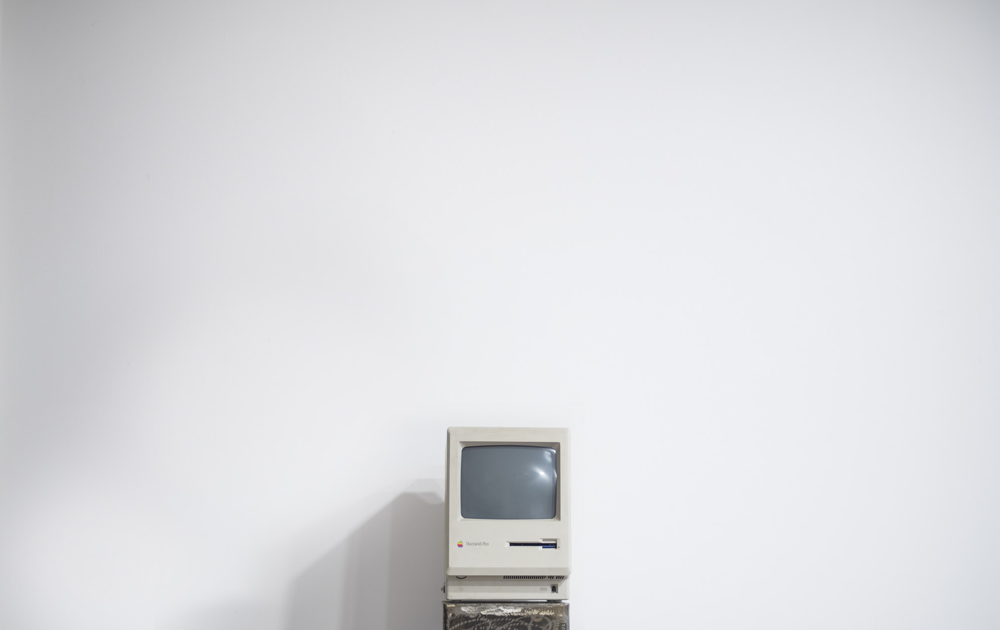

In [4]:
# Nur für Jupyter-Notebooks, verwende mac.show() in anderen IDEs
mac

### Bildinformation

In [5]:
# (Breite, Höhe)
mac.size

(1993, 1257)

In [6]:
mac.filename

'beispiel.jpg'

In [7]:
mac.format_description

'JPEG (ISO 10918)'

## Bilder zuschneiden (cropping)

Mit der Methode `.crop()` kannst du Bilder zuschneiden, das heisst, das Bild auf den gewählten Bereich beschränken. `.crop()` gibt einen rechteckigen Bildausschnitt zurück. Die Parameter sind dabei die linken, oberen und rechten, unteren Pixelkoordinaten.

Beachte: Wenn du den Dokumentationsstring ausgibt, so werden dort die Parameter als `(x, y, w, h)` beschrieben. Das ist irreführend, da Breite (w, width) und Höhe (h, height) nicht wirklich die Parameter sind, sondern die Koordinaten der rechten, unteren Ecke.

Dabei werden die Koordinaten von der linken, oberen Ecke aus gemessen!

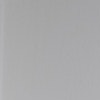

In [8]:
mac.crop((0, 0, 100, 100))

Für das Bild eines Macs ist das keine sinnvolle Demonstration. Lass uns ein anderes Bild verwenden:

In [9]:
stifte = Image.open("stifte.jpg")

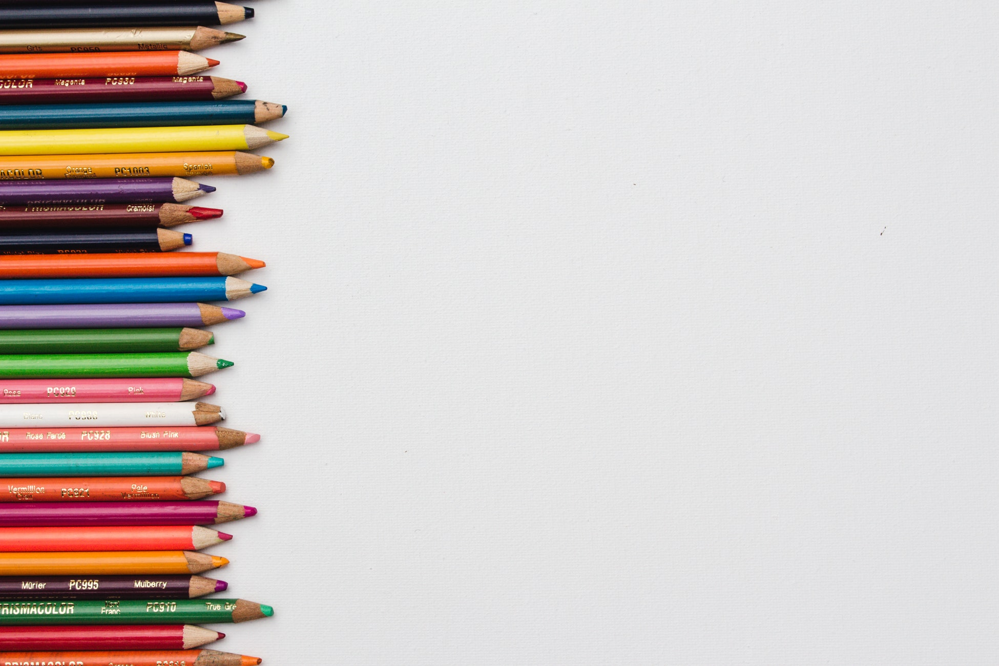

In [10]:
stifte

Wir versuchen jetzt, ein paar der oberen Stifte auszuschneiden.

In [11]:
stifte.size

(1950, 1300)

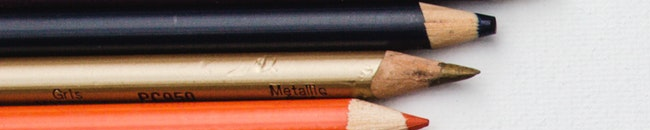

In [12]:
# Beginne in der linken, oberen Ecke (0, 0)
x = 0
y = 0

# Nimm etwa 10% nach unten und etwa 30% nach rechts
w = 1950 / 3
h = 1300 / 10

stifte.crop((x, y, w, h))

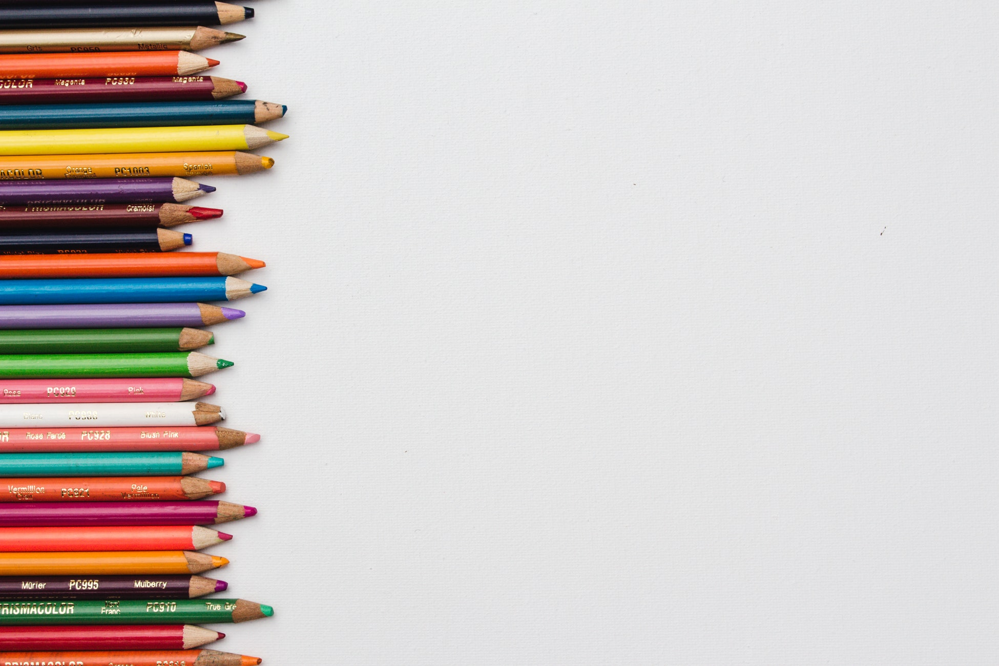

In [13]:
stifte

Und jetzt die Stifte von unten:

In [14]:
stifte.size

(1950, 1300)

In [15]:
x = 0
y = 1100
w = 1950 / 3
h = 1300

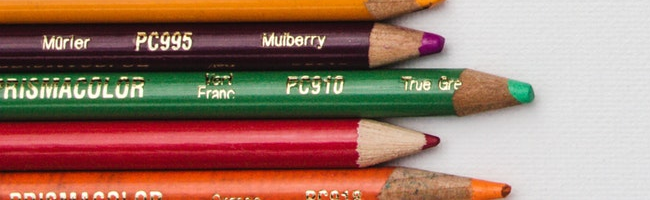

In [16]:
stifte.crop((x,y,w,h))

Jetzt gehen wir zurück zum Bild des Macs und versuchen, nur den Computer auszuschneiden:

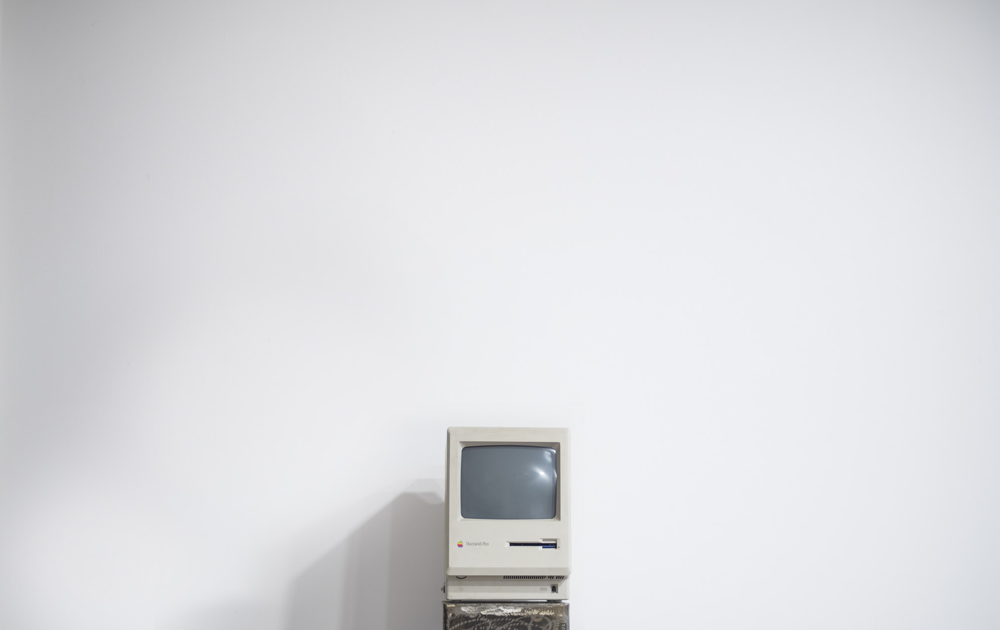

In [17]:
mac

In [18]:
mac.size

(1993, 1257)

In [19]:
halber_weg = 1993 / 2

In [20]:
x = halber_weg - 200
w = halber_weg + 200

In [21]:
y = 800
h = 1257

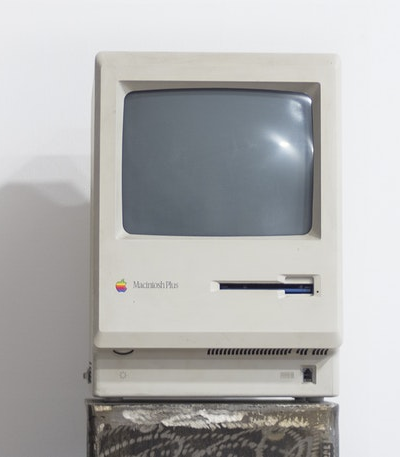

In [22]:
mac.crop((x,y,w,h))

### Bilder kopieren und einfügen

Wir können mit der Methode `.copy` Bilder kopieren und anschliessend mit `.paste`einfügen.

In [23]:
computer = mac.crop((x, y, w, h))

In [24]:
mac.paste(im=computer, box=(0, 0))

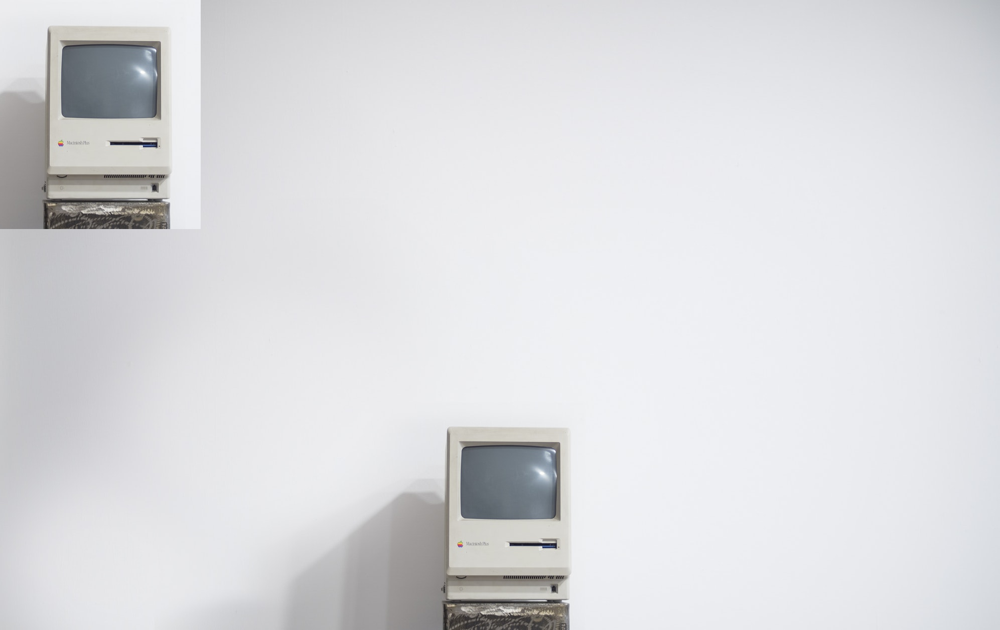

In [25]:
mac

In [26]:
mac.paste(im=computer, box=(796, 0))

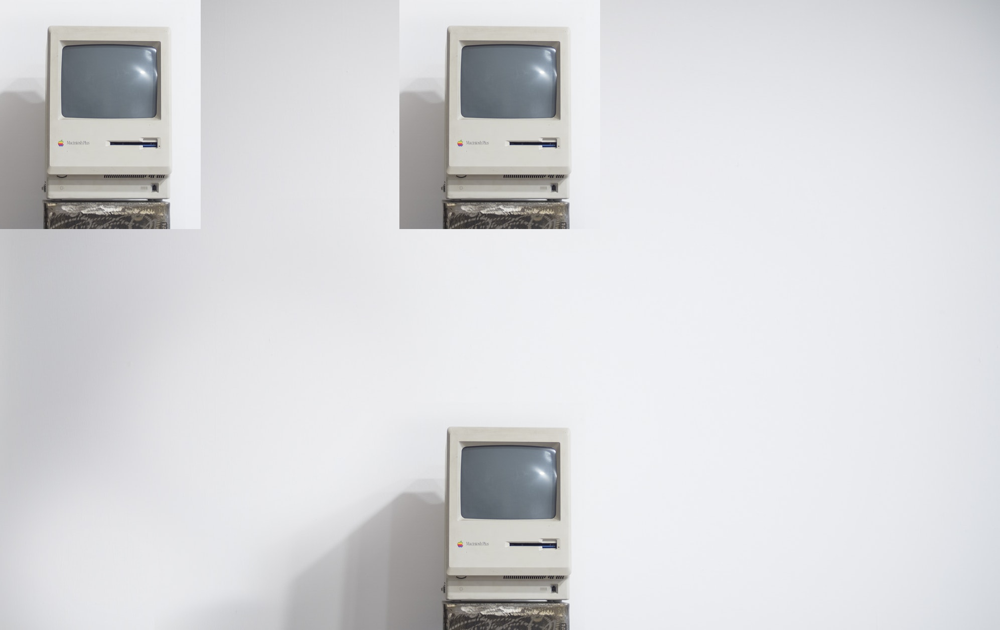

In [27]:
mac

### Skalieren

Zum Skalieren von Bildern kannst du die Methode `.resize` verwenden:

In [28]:
mac.size

(1993, 1257)

In [29]:
h, w = mac.size

In [30]:
h_neu = int(h / 3)
w_neu = int(w / 3)

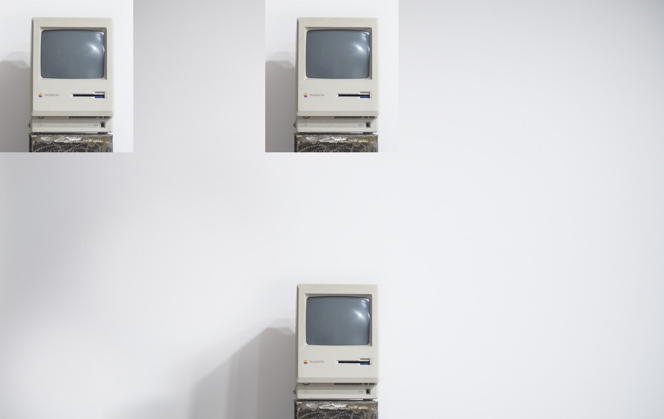

In [31]:
# Beachte, dies ist keine permanente Änderung.
# Dauerhaft wird es durch Neuzuweisung, also z.B. mac = mac.resize((100, 100))
mac.resize((h_neu, w_neu))

Verzerrung geht natürlich auch:

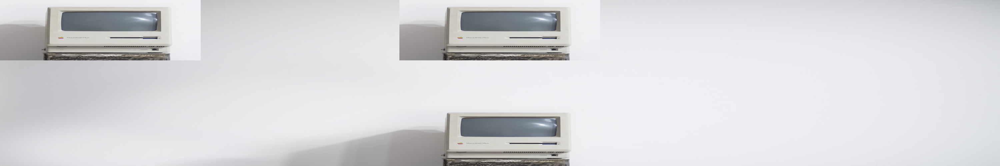

In [32]:
mac.resize((3000,500))

### Bilder rotieren

Du kannst Bilder rotieren, indem du den Grad der Rotation an `.rotate` übergibst. Dabei wird die ursprüngliche Bilddimension beibehalten und mit Schwarz aufgefüllt. Mit einem Zusatzparameter kannst du aber das rotierte Bild an die ursprüngliche Dimension anpassen.

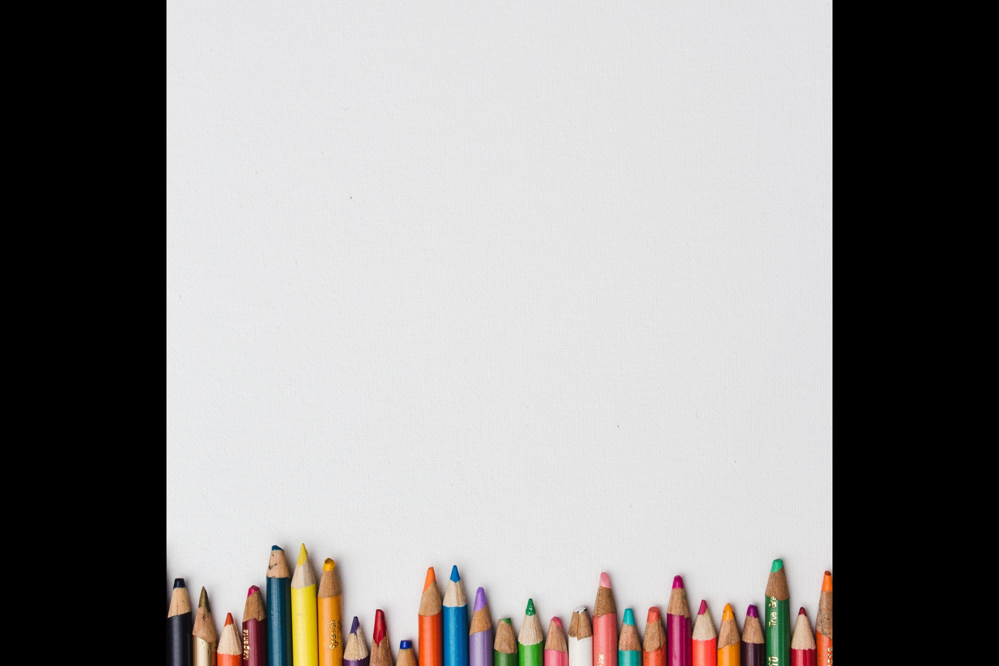

In [33]:
stifte.rotate(90)

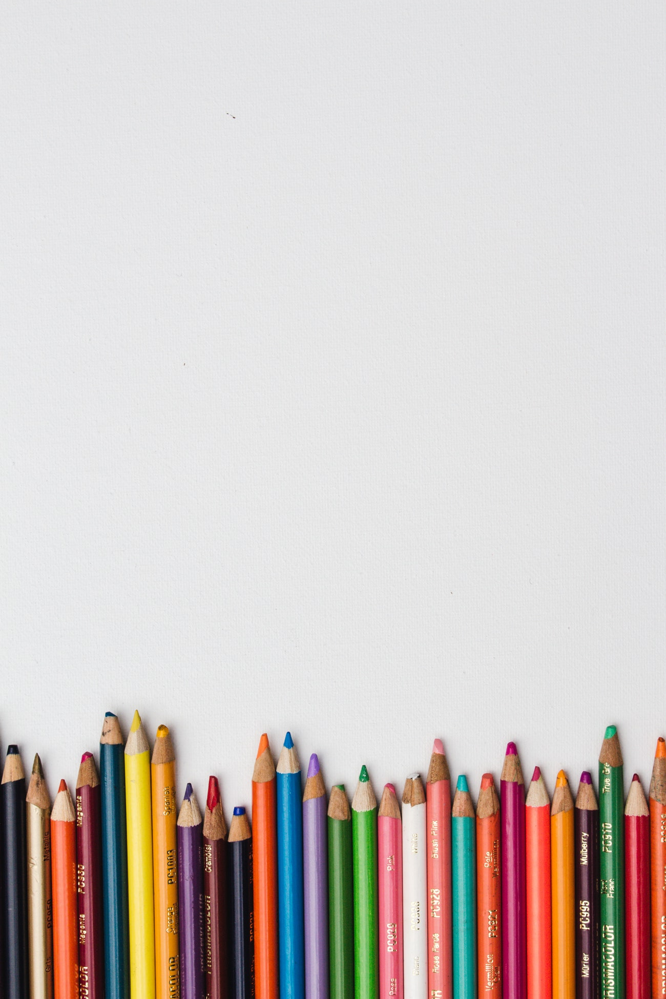

In [34]:
stifte.rotate(90, expand=True)

Beachte, was passiert, wenn wir um 120 Grad rotieren:

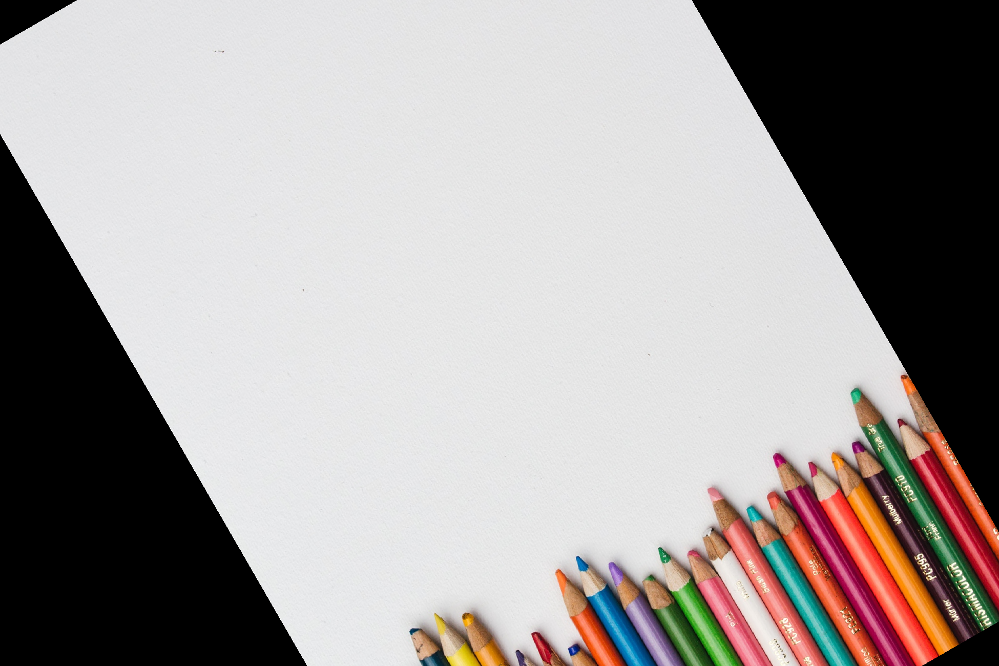

In [35]:
# Das Bild wird abgeschnitten
stifte.rotate(120)

In [36]:
#stifte.rotate(120, expand=True)

## Transparenz

Wir können einfach einen Alphakanal mit einem Zahlenwert von 0 bis 255 hinzufügen (RGBA steht steht für Red, Green, Blue, Alpha). Wenn der Alphakanal 0 ist, so ist das Bild vollkommen transparent, bei 255 hingegen maximal sichtbar.

Hier kannst du für Experimente einfach Farben mischen: https://developer.mozilla.org/en-US/docs/Web/CSS/CSS_Colors/Color_picker_tool

Der Alphakanal wird mit der Methode `.putalpha` eingestellt:

In [37]:
rot = Image.open('farbe_rot.jpg')

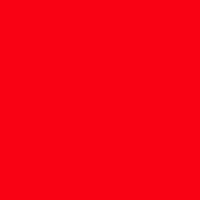

In [38]:
rot

In [39]:
blau = Image.open('farbe_blau.jpg')

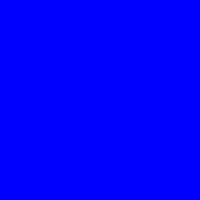

In [40]:
blau

In [41]:
rot.putalpha(128)

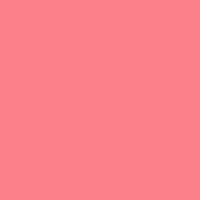

In [42]:
rot

In [43]:
blau.putalpha(128)

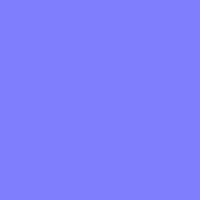

In [44]:
blau

In [45]:
blau.paste(rot, box=(0, 0), mask=rot)

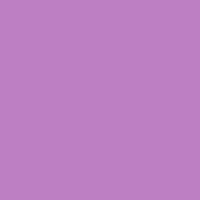

In [46]:
# Erzeuge ein lilanes Bild
blau

Transparenz und Maskierung kann viel komplexer als die hier gezeigten, einfachen Anwendungen sein. Mehr Informationen findest du in der Dokumentation: https://pillow.readthedocs.io/en/stable/

## Bilder speichern

Wir speichern jetzt das aktualisierte blaue Bild als "lila.png" in diesem Verzeichnis.

In [48]:
blau.save("lila.png")

Lass uns testen, ob es funktioniert hat:

In [49]:
lila = Image.open("lila.png")

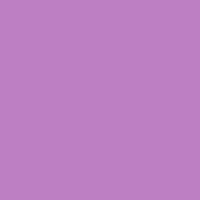

In [50]:
lila

## Gute Arbeit!